In [1]:
import os
if "KERAS_BACKEND" not in os.environ:
    os.environ["KERAS_BACKEND"] = "torch"

import math
import numpy as np
import seaborn as sns
import pandas as pd
import keras
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.stats import truncnorm
from numba import njit
import bayesflow as bf

import DDMChelpers
import helpers

INFO:bayesflow:Using backend 'torch'
When using torch backend, we need to disable autograd by default to avoid excessive memory usage. Use

with torch.enable_grad():
    ...

in contexts where you need gradients (e.g. custom training loops).


#### Generate DDMC data

In [2]:
@njit
def ddmc_trial(t0, muc, b, A1, A2, tau1, tau2, sigma = 4.0, dt = 1.0, max_time = 7000):
    """
    Simulate a single DDMC trial with diffusion constant sigma = 4.0. 
    Parameters: 
        - t0: non-decision time
        - muc: drift rate controlled process
        - b: upper boundary (lower boundary: -b)
        - A1, A2: amplitudes of automatic processes
        - tau1, tau2: timepoint of max automatic activation
    Return: list with result
        - choice (correct = 1.0, incorrect = 0.0, no decision = -1.0)
        - rt (ms)
    """

    dX = np.random.beta(3, 3) * (2 * b) - b    # initial position
    const = sigma * np.sqrt(dt)
    t = dt

    # Loop through process and check boundary conditions
    while (b > dX > -b) and t <= max_time:
        
        noise = np.random.randn()
        # with a2 = a2 = 2
        mu_a1 = A1 / tau1 * np.exp(1 - t / tau1) * (1 - t / tau1)
        mu_a2 = A2 / tau2 * np.exp(1 - t / tau2) * (1 - t / tau2)
        mu_t = mu_a1 + mu_a2 + muc
        
        dX += mu_t * dt + const * noise

        t += dt

    rt = t + t0     # add ndt
    
    # Get decision
    if dX >= b:     # correct
        c = 1.0
    elif dX <= -b:  # incorrect
        c = 0.0
    else:           # no decision within max_time
        c = -1.0
        rt = -1.0

    rt = rt / 1000  # convert to seconds

    return [c, rt]

print(ddmc_trial(muc=0.5, A1=-30, A2=-30, tau1=10, tau2=170, b=50, t0=300))

def simulate_ddmc(t0, muc, b, A1, A2, tau1, tau2, n_subjects=1, n_trials=1):
    """
    Simulate a DDMC experiment for n_subjects with n_trials each
    Results are contaminated
    Parameters: 
        - t0: non-decision time
        - muc: drift rate controlled process
        - b: upper boundary (lower boundary: -b)
        - A1, A2: amplitudes of automatic processes
        - tau1, tau2: timepoint of max automatic activation
    Return: dict containing 'sim_data', an array containing the results
        - [choice, rt, condition]
    """

    if isinstance(muc, (float, int)):
        t0 = np.ones((n_subjects, )) * t0
        muc = np.ones((n_subjects, )) * muc
        b = np.ones((n_subjects, )) * b
        A1 = np.ones((n_subjects, )) * A1
        A2 = np.ones((n_subjects, )) * A2
        tau1 = np.ones((n_subjects, )) * tau1
        tau2 = np.ones((n_subjects, )) * tau2


    data = np.zeros((n_subjects, n_trials, 3))

    for i in range(n_subjects):
        quarter = int(np.ceil(n_trials / 4)) 
        conditions = np.repeat(np.arange(4), quarter)[:n_trials]
        for j in range(n_trials):
            auto1 = 1 if (conditions[j] == 0 or conditions[j] == 1) else -1 # CC, CI
            auto2 = 1 if (conditions[j] == 0 or conditions[j] == 2) else -1 # CC, IC
            res = ddmc_trial(
                t0[i], muc[i], b[i], auto1*A1[i], auto2*A2[i], tau1[i], tau2[i]
            )
            res.append(conditions[j])
            data[i, j] = res
    
#    # contaminate
#    cont_rt = np.abs(
#        np.random.standard_t(df = 1, size = n_subjects * n_trials)
#    ).reshape(n_subjects, n_trials)
#    cont_resp = np.random.binomial(
#        n = 1, p = 0.5, size = n_subjects * n_trials
#    ).reshape(n_subjects, n_trials)
#
#    cont_prob = 0.1
#    replace = np.random.binomial(
#        n = 1, p = cont_prob, size = n_subjects * n_trials
#    ).reshape(n_subjects, n_trials)
#    
#    print(data)
#
#    print("cont_rt: ", cont_rt)
#    print("cont_resp: ", cont_resp)
#    print("replace: ", replace)
#
#    data[:, :, 1] = (1-replace)*data[:, :, 1] + [replace*cont_rt]
#    data[:, :, 0] = (1-replace)*data[:, :, 0] + [replace*cont_resp]

    if n_subjects == 1 and n_trials == 1:
        data = data[0, 0]
    elif n_subjects == 1:
        data = data[0]
    elif n_trials == 1:
        data = data[:, 0]

    return dict(sim_data=data)
print(simulate_ddmc(300, 0.5, 50, 30, 30, 30, 170, n_subjects=2, n_trials=4))



[0.0, 0.303]
{'sim_data': array([[[1.   , 0.318, 0.   ],
        [1.   , 0.319, 1.   ],
        [1.   , 0.319, 2.   ],
        [1.   , 0.525, 3.   ]],

       [[1.   , 0.343, 0.   ],
        [1.   , 0.311, 1.   ],
        [0.   , 0.315, 2.   ],
        [0.   , 0.306, 3.   ]]])}


#### Priors

In [3]:
global_prior = {
    'mu_t0'     : (360.0, 50.0),
    'mu_muc'    : (0.4, 0.1),
    'mu_b'      : (55, 15),
    'mu_A1'     : (20, 8),
    'mu_A2'     : (20, 8),
    'mu_tau1' : ([30, 180], 15),
    'mu_tau2' : ([30, 180], 15),

    'log_sigma_t0'  : (3.5, 0.3),
    'log_sigma_muc' : (-1.7, 0.5),
    'log_sigma_b'   : (2.3, 0.4),
    'log_sigma_A1'  : (1.6, 0.5),
    'log_sigma_A2'  : (1.6, 0.5),
    'log_sigma_tau1': (3.0, 0.5),
    'log_sigma_tau2': (3.0, 0.5)
}

print(np.exp(global_prior['log_sigma_t0']))
print(np.exp(global_prior['log_sigma_muc']))
print(np.exp(global_prior['log_sigma_b']))
print(np.exp(global_prior['log_sigma_A1']))
print(np.exp(global_prior['log_sigma_A2']))
print(np.exp(global_prior['log_sigma_tau1']))
print(np.exp(global_prior['log_sigma_tau2']))

[33.11545196  1.34985881]
[0.18268352 1.64872127]
[9.97418245 1.4918247 ]
[4.95303242 1.64872127]
[4.95303242 1.64872127]
[20.08553692  1.64872127]
[20.08553692  1.64872127]


In [4]:
def sample_hierarchical_priors(rng=None, n_subjects = 1):
    """
    Sample priors
    Group level: t0, muc, b, A1, A2: normal distribution; 
                 tau1, tau2: mixture distribution of two normal distributions
    Subject level: normal distributions for all parameters
    """
    if rng == None: 
        rng = np.random.default_rng()

    ax = 0
    bx = np.inf

    # Group level
    mu_t0   = truncnorm.rvs(
        (ax - global_prior['mu_t0'][0]) / global_prior['mu_t0'][1], 
        (bx - global_prior['mu_t0'][0]) / global_prior['mu_t0'][1], 
        global_prior['mu_t0'][0], global_prior['mu_t0'][1], random_state = rng
    )
    mu_muc  = truncnorm.rvs(
        (ax - global_prior['mu_muc'][0]) / global_prior['mu_muc'][1], 
        (bx - global_prior['mu_muc'][0]) / global_prior['mu_muc'][1], 
        global_prior['mu_muc'][0],  global_prior['mu_muc'][1], random_state = rng
    )
    mu_b    = truncnorm.rvs(
        (ax - global_prior['mu_b'][0]) /  global_prior['mu_b'][1], 
        (bx - global_prior['mu_b'][0]) /  global_prior['mu_b'][1], 
        global_prior['mu_b'][0],  global_prior['mu_b'][1], random_state = rng
    )
    mu_A1   = truncnorm.rvs(
        (ax - global_prior['mu_A1'][0]) / global_prior['mu_A1'][1], 
        (bx - global_prior['mu_A1'][0]) / global_prior['mu_A1'][1], 
        global_prior['mu_A1'][0], global_prior['mu_A1'][1], random_state = rng
    )
    mu_A2   = truncnorm.rvs(
        (ax - global_prior['mu_A2'][0]) / global_prior['mu_A2'][1], 
        (bx - global_prior['mu_A2'][0]) / global_prior['mu_A2'][1], 
        global_prior['mu_A2'][0], global_prior['mu_A2'][1], random_state = rng
    )
    
    # Mixture distribution for tau1, tau2
    c1 = rng.binomial(1, 0.5)
    c2 = rng.binomial(1, 0.5)
    if c1 == 0: 
        mu_tau1 = truncnorm.rvs(
            (ax - global_prior['mu_tau1'][0][0]) / global_prior['mu_tau1'][1], 
            (bx - global_prior['mu_tau1'][0][0]) / global_prior['mu_tau1'][1], 
            global_prior['mu_tau1'][0][0], global_prior['mu_tau1'][1], 
            random_state = rng
        )
    else: 
        mu_tau1 = truncnorm.rvs(
            (ax - global_prior['mu_tau1'][0][1]) / global_prior['mu_tau1'][1], 
            (bx - global_prior['mu_tau1'][0][1]) / global_prior['mu_tau1'][1], 
            global_prior['mu_tau1'][0][1], global_prior['mu_tau1'][1], 
            random_state = rng
        )
       
    if c2 == 0: 
        mu_tau2 = truncnorm.rvs(
            (ax - global_prior['mu_tau2'][0][0]) / global_prior['mu_tau2'][1], 
            (bx - global_prior['mu_tau2'][0][0]) / global_prior['mu_tau2'][1], 
            global_prior['mu_tau2'][0][0], global_prior['mu_tau2'][1], 
            random_state = rng
        )
    else: 
        mu_tau2 = truncnorm.rvs(
            (ax - global_prior['mu_tau2'][0][1]) / global_prior['mu_tau2'][1], 
            (bx - global_prior['mu_tau2'][0][1]) / global_prior['mu_tau2'][1], 
            global_prior['mu_tau2'][0][1], global_prior['mu_tau2'][1], 
            random_state = rng
        )

    log_sigma_t0 = rng.normal(*global_prior['log_sigma_t0'])
    log_sigma_b = rng.normal(*global_prior['log_sigma_b'])
    log_sigma_muc = rng.normal(*global_prior['log_sigma_muc'])
    log_sigma_A1 = rng.normal(*global_prior['log_sigma_A1'])
    log_sigma_A2 = rng.normal(*global_prior['log_sigma_A2'])
    log_sigma_tau1 = rng.normal(*global_prior['log_sigma_tau1'])
    log_sigma_tau2 = rng.normal(*global_prior['log_sigma_tau2'])

    # Subject level
    t0 = truncnorm.rvs(
        (ax - mu_t0) / np.exp(log_sigma_t0), (bx - mu_t0) / np.exp(log_sigma_t0), 
        mu_t0, np.exp(log_sigma_t0), size=n_subjects, random_state=rng
    )
    muc = truncnorm.rvs(
        (ax - mu_muc) / np.exp(log_sigma_muc), (bx - mu_muc) / np.exp(log_sigma_muc), 
        mu_muc, np.exp(log_sigma_muc), size=n_subjects, random_state = rng
    )
    b = truncnorm.rvs(
        (ax - mu_b) / np.exp(log_sigma_b), (bx - mu_b) / np.exp(log_sigma_b), 
        mu_b, np.exp(log_sigma_b), size=n_subjects, random_state = rng
    )
    A1 = truncnorm.rvs(
        (ax - mu_A1) / np.exp(log_sigma_A1), (bx - mu_A1) / np.exp(log_sigma_A1), 
        mu_A1, np.exp(log_sigma_A1), size=n_subjects, random_state = rng
    )
    A2 = truncnorm.rvs(
        (ax - mu_A2) / np.exp(log_sigma_A2), (bx - mu_A2) / np.exp(log_sigma_A2), 
        mu_A2, np.exp(log_sigma_A2), size=n_subjects, random_state = rng
    )
    tau1 = truncnorm.rvs(
        (ax - mu_tau1) / np.exp(log_sigma_tau1), 
        (bx - mu_tau1) / np.exp(log_sigma_tau1), 
        mu_tau1, np.exp(log_sigma_tau1), size=n_subjects, random_state = rng
    )
    tau2 = truncnorm.rvs(
        (ax - mu_tau2) / np.exp(log_sigma_tau2), 
        (bx - mu_tau2) / np.exp(log_sigma_tau2), 
        mu_tau2, np.exp(log_sigma_tau2), size=n_subjects, random_state = rng
    )

    return {
        # group 
        'mu_t0': mu_t0, 'mu_muc': mu_muc, 'mu_b': mu_b, 'mu_A1': mu_A1, 
        'mu_A2': mu_A2, 'mu_tau1': mu_tau1, 'mu_tau2' : mu_tau2, 
        'log_sigma_t0': log_sigma_t0, 'log_sigma_muc': log_sigma_muc, 
        'log_sigma_b': log_sigma_b, 'log_sigma_A1': log_sigma_A1, 
        'log_sigma_A2'  : log_sigma_A2, 'log_sigma_tau1': log_sigma_tau1, 
        'log_sigma_tau2': log_sigma_tau2, 

        # subject
        't0': t0, 'muc': muc, 'b': b, 'A1': A1, 'A2': A2, 'tau1': tau1, 
        'tau2': tau2
    }

print(sample_hierarchical_priors())

{'mu_t0': np.float64(282.40374812798314), 'mu_muc': np.float64(0.42943890166652093), 'mu_b': np.float64(40.930751296966825), 'mu_A1': np.float64(18.111462598291567), 'mu_A2': np.float64(23.147951439212427), 'mu_tau1': np.float64(25.144085873695964), 'mu_tau2': np.float64(30.396194758594813), 'log_sigma_t0': 3.571142541052695, 'log_sigma_muc': -1.027047642665173, 'log_sigma_b': 1.6324493867815133, 'log_sigma_A1': 1.1702435005442413, 'log_sigma_A2': 1.0583351814060826, 'log_sigma_tau1': 2.3848275557179184, 'log_sigma_tau2': 2.509379827936524, 't0': array([275.75517072]), 'muc': array([0.35709262]), 'b': array([41.34401534]), 'A1': array([17.25254513]), 'A2': array([21.99323559]), 'tau1': array([19.82726195]), 'tau2': array([29.41397575])}


In [5]:
def score_log_norm(x, m, s):
    return -(x-m) / s**2

def score_log_mixture(x, m1, s1, m2, s2):
    n1 = np.exp(-0.5 * ((x - m1) / s1) ** 2) / (np.sqrt(2*np.pi) * s1)
    n2 = np.exp(-0.5 * ((x - m2) / s2) ** 2) / (np.sqrt(2*np.pi) * s2)

    p = 0.5 * n1 + 0.5 * n2

    return (
        0.5 * n1 * (-(x - m1) / s1**2)
        + 0.5 * n2 * (-(x - m2) / s2**2)
    ) / p

    
def prior_global_score(x: dict[str, np.ndarray]) -> dict[str, np.ndarray]:
    mu_t0   = x["mu_t0"]
    mu_muc  = x["mu_muc"]
    mu_b    = x["mu_b"]
    mu_A1   = x["mu_A1"]
    mu_A2   = x["mu_A2"]
    mu_tau1 = x["mu_tau1"]
    mu_tau2 = x["mu_tau2"]
    log_sigma_t0    = x["log_sigma_t0"]
    log_sigma_muc   = x["log_sigma_muc"]
    log_sigma_b     = x["log_sigma_b"]
    log_sigma_A1    = x["log_sigma_A1"]
    log_sigma_A2    = x["log_sigma_A2"]
    log_sigma_tau1  = x["log_sigma_tau1"]
    log_sigma_tau2  = x["log_sigma_tau2"]

    parts = {
        "mu_t0": score_log_norm(
            mu_t0, m=global_prior["mu_t0"][0], s=global_prior["mu_t0"][1]
        ),
        "mu_muc": score_log_norm(
            mu_muc, m=global_prior["mu_muc"][0], s=global_prior["mu_muc"][1]
        ),
        "mu_b": score_log_norm(
            mu_b, m=global_prior["mu_b"][0], s=global_prior["mu_b"][1]
        ),
        "mu_A1": score_log_norm(
            mu_A1, m=global_prior["mu_A1"][0], s=global_prior["mu_A1"][1]
        ),
        "mu_A2": score_log_norm(
            mu_A2, m=global_prior["mu_A2"][0], s=global_prior["mu_A2"][1]
        ),
        "mu_tau1": score_log_mixture(
            mu_tau1, 
            m1=global_prior["mu_tau1"][0][0],m2=global_prior["mu_tau1"][0][1], 
            s1=global_prior["mu_tau1"][1], s2=global_prior["mu_tau1"][1]
        ),
        "mu_tau2": score_log_mixture(
            mu_tau2, 
            m1=global_prior["mu_tau2"][0][0],m2=global_prior["mu_tau2"][0][1], 
            s1=global_prior["mu_tau2"][1], s2=global_prior["mu_tau2"][1]
        ),

        "log_sigma_t0": score_log_norm(
            log_sigma_t0, 
            m=global_prior["log_sigma_t0"][0], 
            s=global_prior["log_sigma_t0"][1]
        ),
        "log_sigma_muc": score_log_norm(
            log_sigma_muc, 
            m=global_prior["log_sigma_muc"][0], 
            s=global_prior["log_sigma_muc"][1]
        ),
        "log_sigma_b": score_log_norm(
            log_sigma_b, 
            m=global_prior["log_sigma_b"][0], s=global_prior["log_sigma_b"][1]
        ),
        "log_sigma_A1": score_log_norm(
            log_sigma_A1, 
            m=global_prior["log_sigma_A1"][0], s=global_prior["log_sigma_A1"][1]
        ),
        "log_sigma_A2": score_log_norm(
            log_sigma_A2, 
            m=global_prior["log_sigma_A2"][0], s=global_prior["log_sigma_A2"][1]
        ),
        "log_sigma_tau1": score_log_norm(
            log_sigma_tau1, 
            m=global_prior["log_sigma_tau1"][0], 
            s=global_prior["log_sigma_tau1"][1]
        ),
        "log_sigma_tau2": score_log_norm(
            log_sigma_tau2, 
            m=global_prior["log_sigma_tau2"][0], 
            s=global_prior["log_sigma_tau2"][1]
        ),
    }
    return parts

#### Simulator

In [6]:
simulator_hierarchical = bf.make_simulator([sample_hierarchical_priors, simulate_ddmc])
simdata = simulator_hierarchical.sample(12)
#simdata = simulator_hierarchical.sample_parallel(12, n_subjects = 10, n_trials = 40)
print("Shape of rt, resp, condition:", simdata["sim_data"].shape)
#print(simdata["sim_data"])

Shape of rt, resp, condition: (12, 3)


### Prior samples

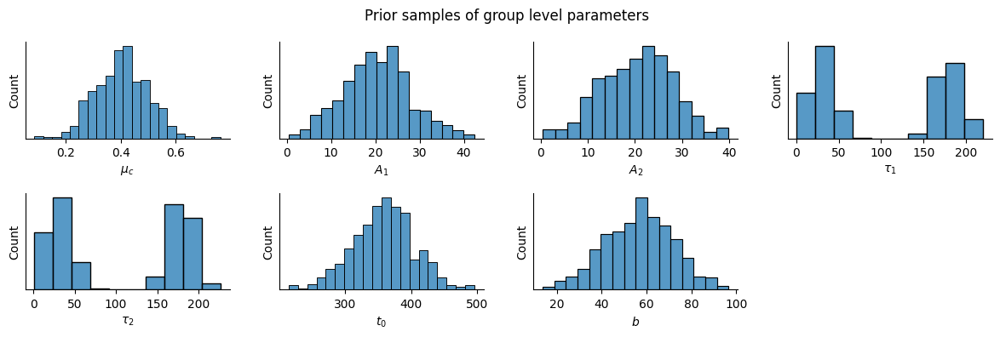

In [7]:
params_group = ["mu_muc", "mu_A1", "mu_A2", "mu_tau1", "mu_tau2", "mu_t0", "mu_b"]
params_group_names = [
    r"$\mu_c$", r"$A_1$", r"$A_2$", r"$\tau_1$", r"$\tau_2$", 
    r"$t_0$", r"$b$"
]
example_sim = simulator_hierarchical.sample(500)
f, axarr = plt.subplots(2, 4, figsize=(12, 4))
for i in range(len(params_group)): 
    ax = axarr.flat[i]
    sns.histplot(example_sim[params_group[i]].flatten(), alpha=0.75, ax=ax)
    sns.despine(ax=ax)
    ax.set_xlabel(params_group_names[i])
    ax.set_yticks([])
f.suptitle("Prior samples of group level parameters")
f.tight_layout()
f.delaxes(axarr[1][3])

ER: 0.05266666666666664


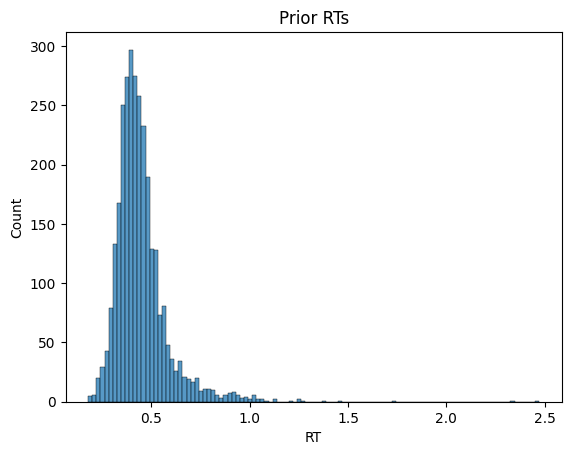

In [8]:
n = 3000
prior_sim = simulator_hierarchical.sample(n)

f = sns.histplot(prior_sim['sim_data'][:,1])
f.set_xlabel("RT")
f.set_title("Prior RTs")

print("ER:", 1 - sum(prior_sim['sim_data'][:,0]) / n)        # ER

INFO:bayesflow:Using backend 'torch'
When using torch backend, we need to disable autograd by default to avoid excessive memory usage. Use

with torch.enable_grad():
    ...

in contexts where you need gradients (e.g. custom training loops).


mu_muc : [0.34523881]
mu_A1 : [26.07285003]
mu_A2 : [27.63621785]
mu_tau1 : [183.2408363]
mu_tau2 : [184.6133846]
mu_t0 : [392.69156234]
mu_b : [50.88210225]
t0 : [465.14576328]
muc : [0.30502306]
b : [44.59388332]
A1 : [28.50419226]
A2 : [22.57150846]
tau1 : [215.75284262]
tau2 : [178.82787752]
Condition:  0 , M:  0.5290035410564229 , SD:  0.0739162122913923 , ER:  0.04
Condition:  1 , M:  0.5567768743897562 , SD:  0.07526647127881998 , ER:  0.18222222222222223
Condition:  2 , M:  0.5682879855008673 , SD:  0.08107191454748718 , ER:  0.19555555555555557
Condition:  3 , M:  0.573185763278645 , SD:  0.09039519751255226 , ER:  0.5288888888888889


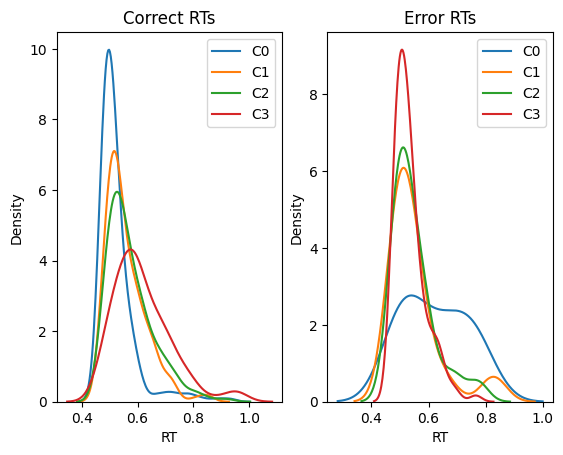

In [9]:
params_subj = ["t0", "muc", "b", "A1", "A2", "tau1", "tau2"]
params_subj_names = [
    r"$t_0$", r"$\mu_c$", r"$b$", r"$A_1$", r"$A_2$", r"$\tau_1$", r"$\tau_2$" 
]

N_SUBJ = 1
N_TRL = 900
N_SIM = 1

example_sim_h = simulator_hierarchical.sample_parallel(
    N_SIM, n_subjects = N_SUBJ, n_trials = N_TRL
)
#print(example_sim_h)

# Parameters
for param in params_group: 
    print(param, ":", example_sim_h[param].flatten())
for param in params_subj: 
    print(param, ":", example_sim_h[param].flatten())


# RTs, ERs
data = example_sim_h["sim_data"].reshape(N_SIM * N_SUBJ * N_TRL, 3)

def plot_rts_conditions(data): 
    """
    Calculate mean RT, SD and ER per condition, 
    plot RT densities per condition for correct and error RTs separately
    """

    for cond in range(4):
        rts = data[data[:,2] == cond, 1]
        ers = data[data[:,2] == cond, 0]
        print(
            "Condition: ", cond, ", M: ", np.mean(rts), ", SD: ", np.std(rts), 
            ", ER: ", np.sum(ers != 1.0) / len(ers)
        )

    fig, (ax1, ax2) = plt.subplots(1, 2)
    # Correct RTs plot

    for cond in range(4):
        x = data[(data[:,2] == cond) & (data[:,0] == 1), 1]
        sns.kdeplot(x, label=f"C{cond}", ax=ax1)
    ax1.legend()
    ax1.set_xlabel("RT")
    ax1.set_title("Correct RTs")

    # Error RTs plot
    for cond in range(4):
        x = data[(data[:,2] == cond) & (data[:,0] != 1), 1]
        sns.kdeplot(x, label=f"C{cond}", ax=ax2)
    ax2.legend()
    ax2.set_xlabel("RT")
    ax2.set_title("Error RTs")
    
    plt.show()

plot_rts_conditions(data)

#### Adapters, Workflows

In [10]:
param_names_global = list(global_prior.keys())
param_names_local = ['t0', 'muc', 'b', 'A1', 'A2', 'tau1', 'tau2']

# Global (group-level) workflow
adapter_global = (
    bf.adapters.Adapter()
    .to_array()
    .convert_dtype("float64", "float32")
    .concatenate(param_names_global, into="inference_variables")
    .rename("sim_data", "summary_variables")
)

workflow_global = bf.CompositionalWorkflow(
    adapter=adapter_global,
    simulator=simulator_hierarchical,
    initial_learning_rate=5e-4,
    summary_network=bf.networks.DeepSet(
        dropout=0.01070354852467715,
        summary_dim=24             # 4 * dim of inference variables (4 * 1 * 8)
    ),
    inference_network=bf.networks.DiffusionModel(
        dropout=0.01070354852467715
    ),
    checkpoint_filepath = Path(os.getcwd()).resolve(),  # save in cwd
    checkpoint_name = "TEST_HIERARCHICAL_GLOBAL"        # file name
)


# Local (subject-level) workflow
adapter_local = (
    bf.adapters.Adapter()
    .to_array()
    .convert_dtype("float64", "float32")
    .concatenate(param_names_local, into="inference_variables")
    .concatenate(param_names_global, into="inference_conditions")
    .rename("sim_data", "summary_variables")
)

workflow_local = bf.BasicWorkflow(
    adapter=adapter_local,
    initial_learning_rate=5e-4,
    summary_network=bf.networks.SetTransformer(
        dropout=0.01070354852467715, 
        summary_dim=24             # 4 * dim of inference variables (4 * 1 * 8)
    ),
    inference_network=bf.networks.StableConsistencyModel(
        dropout=0.01070354852467715
    ), 
    checkpoint_filepath = Path(os.getcwd()).resolve(),  # save in cwd
    checkpoint_name = "TEST_HIERARCHICAL_LOCAL"         # file name
)

In [11]:
# Load trained models
#approximator_global = keras.saving.load_model("out/1106-global.keras")
#approximator_local = keras.saving.load_model("out/1106-local.keras")
approximator_global = keras.saving.load_model("out/HDDMC_GLOBAL_500.keras")
approximator_local = keras.saving.load_model("out/HDDMC_LOCAL_500.keras")

In [12]:
N_TRAINING_BATCHES = 256
BATCH_SIZE = 32#64
EPOCHS = 3#1_000
N_LOCAL_SUBJECTS = 5  # number of subjects in a single training batch

N_TRIALS = 40         # trials per subject
N_SUBJECTS = 10#10_000   # number of subjects in one experiment
N_TEST = 50#100          # number of test data sets
N_SAMPLES = 50#100       # posterior samples per test dataset

#### Diagnostics

In [71]:
# validate that the trained global workflow can recover parameters on test 
# datasets of the same scale (N_LOCAL_SUBJECTS subjects, N_TRIALS trials each).

test_data_single = simulator_hierarchical.sample_parallel(
    100, n_subjects=20, n_trials=200
)
test_data_single['sim_data'] = test_data_single['sim_data'].reshape((
    100, 20 * 200, 3)
)

test_posterior = approximator_global.sample(
    num_samples=N_SAMPLES,
    conditions={'sim_data': test_data_single['sim_data']},
    batch_size=BATCH_SIZE,
)

INFO:bayesflow:Using backend 'torch'
When using torch backend, we need to disable autograd by default to avoid excessive memory usage. Use

with torch.enable_grad():
    ...

in contexts where you need gradients (e.g. custom training loops).
INFO:bayesflow:Using backend 'torch'
When using torch backend, we need to disable autograd by default to avoid excessive memory usage. Use

with torch.enable_grad():
    ...

in contexts where you need gradients (e.g. custom training loops).
INFO:bayesflow:Using backend 'torch'
When using torch backend, we need to disable autograd by default to avoid excessive memory usage. Use

with torch.enable_grad():
    ...

in contexts where you need gradients (e.g. custom training loops).
INFO:bayesflow:Using backend 'torch'
When using torch backend, we need to disable autograd by default to avoid excessive memory usage. Use

with torch.enable_grad():
    ...

in contexts where you need gradients (e.g. custom training loops).
INFO:bayesflow:Using backend 'to

Summarizing:   0%|          | 0/4 [00:00<?, ?batch/s]

Sampling:   0%|          | 0/4 [00:00<?, ?batch/s]

KeyboardInterrupt: 

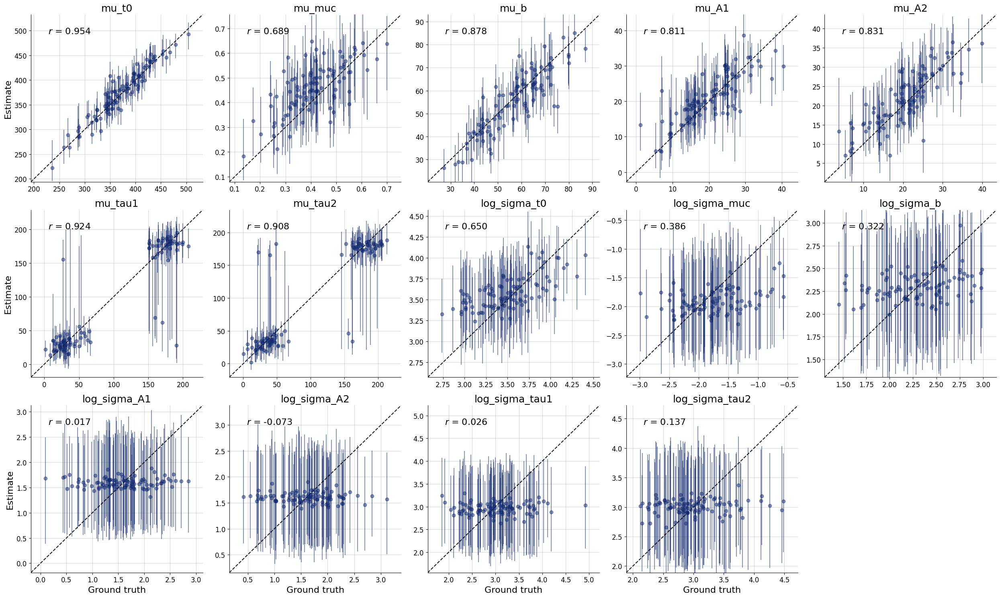

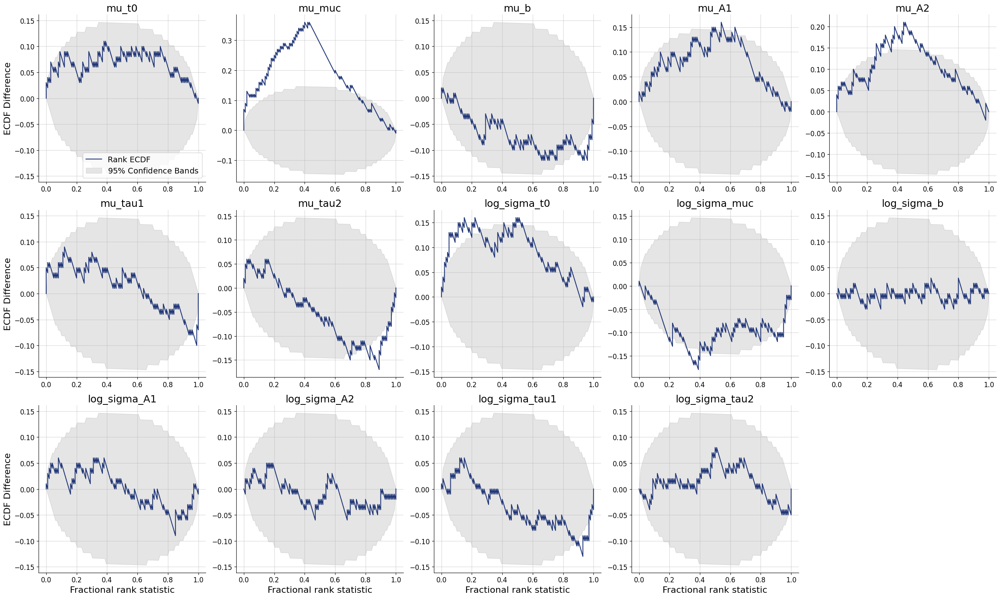

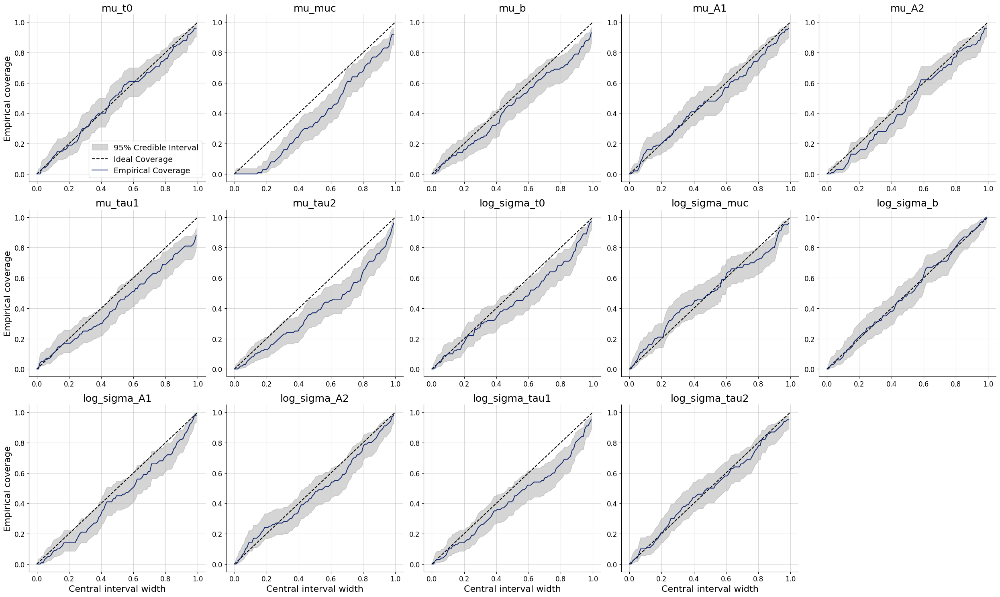

In [11]:
fig_recovery = bf.diagnostics.recovery(
    estimates=test_posterior,
    targets=test_data_single
)
#fig_recovery.savefig('recovery_pt_global.pdf')

#fig_sbc2 = bf.diagnostics.calibration_histogram(
#    estimates=test_posterior,
#    targets=test_data_single
#)

fig_sbc1 = bf.diagnostics.calibration_ecdf(
    estimates=test_posterior,
    targets=test_data_single
)
#fig_sbc1.savefig('sbc1_pt_global.pdf')

fig_coverage = bf.diagnostics.coverage(
    estimates=test_posterior,
    targets=test_data_single
)
#fig_coverage.savefig('coverage_pt_global.pdf')

In [ ]:
test_data = simulator_hierarchical.sample_parallel(
    N_TEST, n_subjects=N_SUBJECTS, n_trials=N_TRIALS
)

# bring the data in the right format
test_data['sim_data'] = test_data['sim_data'].reshape((
    N_TEST, N_SUBJECTS // N_LOCAL_SUBJECTS, N_TRIALS * N_LOCAL_SUBJECTS, 3)
)
summaries = None  # will be computed later by the workflow


INFO:bayesflow:Using backend 'torch'
When using torch backend, we need to disable autograd by default to avoid excessive memory usage. Use

with torch.enable_grad():
    ...

in contexts where you need gradients (e.g. custom training loops).
INFO:bayesflow:Using backend 'torch'
When using torch backend, we need to disable autograd by default to avoid excessive memory usage. Use

with torch.enable_grad():
    ...

in contexts where you need gradients (e.g. custom training loops).
INFO:bayesflow:Using backend 'torch'
When using torch backend, we need to disable autograd by default to avoid excessive memory usage. Use

with torch.enable_grad():
    ...

in contexts where you need gradients (e.g. custom training loops).
INFO:bayesflow:Using backend 'torch'
When using torch backend, we need to disable autograd by default to avoid excessive memory usage. Use

with torch.enable_grad():
    ...

in contexts where you need gradients (e.g. custom training loops).
INFO:bayesflow:Using backend 'to

In [174]:
global_posterior = approximator_global.compositional_sample(
    num_samples=N_SAMPLES,
    conditions={'sim_data': test_data['sim_data']}, # get rid of all unnecessary keys
    compute_prior_score=prior_global_score,
    compositional_bridge_d1=0.1,     # hyperparameter, control error accumulation
    compositional_bridge_d0=0.1,     # hyperparameter, control error accumulation
    method='two_step_adaptive',       # hyperparameter, try "euler_maruyama" for non-adaptive method
    steps='adaptive',                 # hyperparameter, speed vs accuracy/stability
    mini_batch_size=10,               # hyperparameter, memory/speed vs accuracy
    batch_size=BATCH_SIZE*10,
    return_summaries=True,
    summaries=summaries,
)
summaries = global_posterior.pop("_summaries")

Summarizing:   0%|          | 0/1 [00:00<?, ?batch/s]

Sampling:   0%|          | 0/1 [00:00<?, ?batch/s]

In [17]:
# only check for N_LOCAL_CONDITIONS local conditions per dataset here
N_LOCAL_CONDITIONS = 10
smaller_test_data = {k: v[:, :N_LOCAL_CONDITIONS] for k, v in test_data.items() if k in param_names_local}
smaller_test_data['sim_data'] = test_data['sim_data'].reshape(N_TEST, N_SUBJECTS, N_TRIALS, 3)[:, :N_LOCAL_CONDITIONS]
#print(smaller_test_data)

local_posterior = approximator_local.ancestral_sample(
    conditions={'sim_data': smaller_test_data['sim_data']},
    ancestral_conditions=global_posterior,
    batch_size=BATCH_SIZE*N_SAMPLES,
)

Summarizing:   0%|          | 0/1 [00:00<?, ?batch/s]

Sampling:   0%|          | 0/16 [00:00<?, ?batch/s]

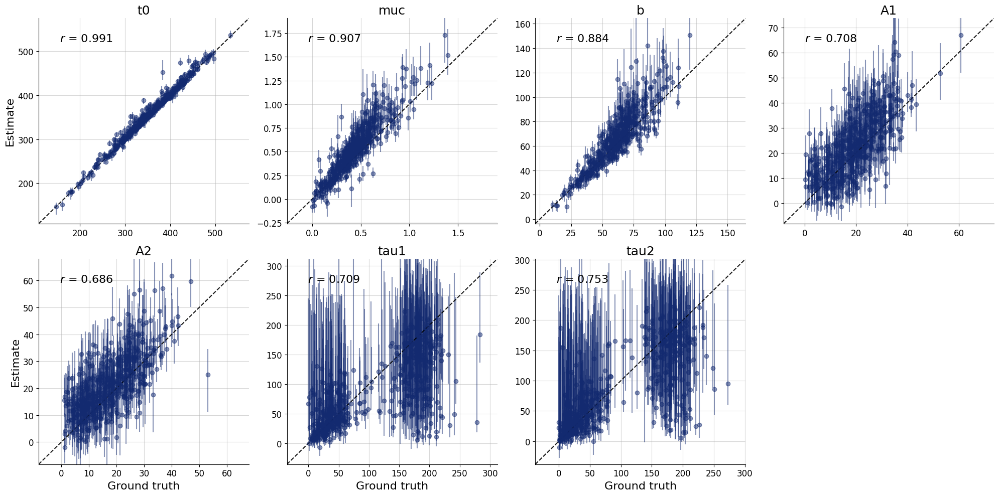

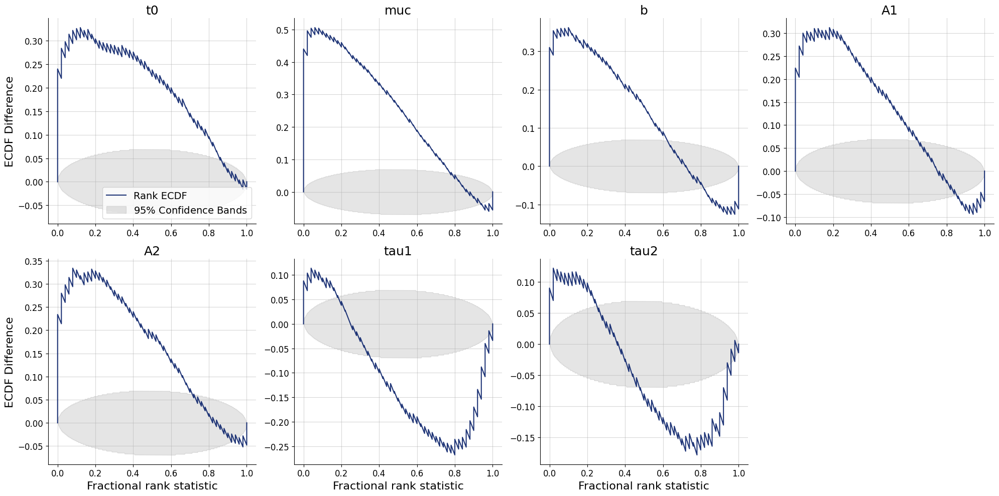

In [19]:
flat_local_posterior = {
    k: v.reshape(N_TEST*N_LOCAL_CONDITIONS, N_SAMPLES, 1) for k, v in local_posterior.items()
}
flat_test_data = {
    k: v.reshape(N_TEST*N_LOCAL_CONDITIONS, 1) for k, v in smaller_test_data.items() if not k == 'sim_data'
}

fig_recovery = bf.diagnostics.recovery(
    estimates=flat_local_posterior,
    targets=flat_test_data
)
fig_recovery.savefig('recovery_pt_local.pdf')

fig_sbc1 = bf.diagnostics.calibration_ecdf(
    estimates=flat_local_posterior,
    targets=flat_test_data
)
fig_sbc1.savefig('sbc1_pt_local.pdf')

## Inference

##### Load Data

In [13]:
directory_1a = "../data/raw/Exp1a_data/combi/"      # Flanker x Stroop
directory_1b = "../data/raw/Exp1b_data/combi/"      # Flanker x Stroop
directory_1c = "../data/raw/Exp1c_data/combi/"      # Flanker x Stroop
directory_2 = "../data/raw/Exp2_data/combi/"        # Simon x Stroop
directory_3 = "../data/raw/Exp3_data/combi/"        # Flanker x Simon

filelist_1a = os.listdir(directory_1a)
filelist_1b = os.listdir(directory_1b)
filelist_1c = os.listdir(directory_1c)
filelist_2 = os.listdir(directory_2)
filelist_3 = os.listdir(directory_3)

colnames_1a = [
    "subject", "block", "catch", "stimulus", "stimuluscolor", "flankercolor", 
    "flanker", "stroop", "xr", "resp", "corr", "rt", "re"
]
colnames_1b = [
    "subject", "block", "catch", "stimulus", "stimuluscolor", "flankercolor", 
    "flanker", "stroop", "stroopstimulusnumber", "flankerstimulusnumber", 
    "stimulusnumber", "xr", "resp", "corr", "rt", "re"
]
colnames_1c = [
    "subject", "block", "trial", "catch", "stimulus", "stimuluscolor", 
    "flankercolor", "flanker", "stroop", "xr", "resp", "corr", "rt", "re"
]
colnames_2 = [
    "subject", "block", "catch", "stimulus", "stimuluscolor", 
    "stimulusposition", "simon", "stroop", "xr", "resp", "corr", "rt", "re"
]
colnames_3 = [
    "subject", "block", "stimulus", "flankercolor", "stimulusposition", 
    "simon", "flanker", "xr", "resp", "corr", "rt", "re"
]

df_1a = helpers.read_ReyMermetGade(
    directory_1a, filelist_1a, colnames_1a, "flanker", "stroop"
)
#df_1b = read_ReyMermetGade(
#   directory_1b, filelist_1b, colnames_1b, "flanker", "stroop"
#)
#df_1c = read_ReyMermetGade(
#   directory_1c, filelist_1c, colnames_1c, "flanker", "stroop"
#)
df_2 = helpers.read_ReyMermetGade(
    directory_2, filelist_2, colnames_2, "simon", "stroop"
)
df_3 = helpers.read_ReyMermetGade(
    directory_3, filelist_3, colnames_3, "simon", "flanker"
)

# exclude catch trials
df_1a = df_1a.drop(df_1a[df_1a.catch == 1].index)
#df_1b = df_1b.drop(df_1b[df_1b.catch == 1].index)
#df_1c = df_1c.drop(df_1c[df_1c.catch == 1].index)
df_2 = df_2.drop(df_2[df_2.catch == 1].index)

# rt outlier exclusion, timeout responses
#df_1a = df_1a[(df_1a["rt"] < 1.5) & (df_1a["rt"] > 0.3) & (df_1a["resp"] != 0)]
#df_1b = df_1b[(df_1b["rt"] < 2.0) & (df_1b["rt"] > 0.3) & (df_1b["resp"] != 0)]
#df_1c = df_1c[(df_1c["rt"] < 2.0) & (df_1c["rt"] > 0.3) & (df_1c["resp"] != 0)]
#df_2 = df_2[(df_2["rt"] < 1.5) & (df_2["rt"] > 0.3) & (df_2["resp"] != 0)]
#df_3 = df_3[(df_3["rt"] < 1.5) & (df_3["rt"] > 0.3) & (df_3["resp"] != 0)]


# drop unused columns
df_1a.drop(['block', 'catch', 're', 'xr'], inplace=True, axis=1)
df_2.drop(['block', 'catch', 're', 'xr'], inplace=True, axis=1)
df_3.drop(['block', 're', 'xr'], inplace=True, axis=1)

#print(df_3)
#print(df_2)
#print(df_1a)
#print(df_1b)
#print(df_1c)

### Group level

In [14]:
def get_group_posterior(df):
    """
    Obtain posterior samples for group level parameters
    
    df: dataframe containing columns 'corr' (correct = 1), 'rt', 'conditions' 
        (ranging 0 to 3)
    
    Returns: dictionary containing parameters as keys and posterior samples as 
             values
    """
    BATCH_SIZE = 64
    obs = np.column_stack([df["corr"], df["rt"], df["conditions"]])
    obs = obs[None, :, :]
    n_resims = 3000
    group_posterior = approximator_global.sample(
        num_samples = n_resims, 
        conditions = {"sim_data": obs}, 
        batch_size = BATCH_SIZE * 10
    )

    return group_posterior

group_posterior_1a = get_group_posterior(df_1a)
group_posterior_2 = get_group_posterior(df_2)
group_posterior_3 = get_group_posterior(df_3)

Summarizing:   0%|          | 0/1 [00:00<?, ?batch/s]

Sampling:   0%|          | 0/1 [00:00<?, ?batch/s]

Summarizing:   0%|          | 0/1 [00:00<?, ?batch/s]

Sampling:   0%|          | 0/1 [00:00<?, ?batch/s]

Summarizing:   0%|          | 0/1 [00:00<?, ?batch/s]

Sampling:   0%|          | 0/1 [00:00<?, ?batch/s]

In [ ]:
for key in group_posterior_3.keys(): 
    if min(group_posterior_1a[key].flatten()) < 0: 
        #print("prior", key, sum(np.where(example_sim[key].flatten() < 0)))
        print("Exp. 1a", key, np.sum(group_posterior_1a[key].flatten() < 0))
for key in group_posterior_2.keys(): 
    if min(group_posterior_2[key].flatten()) < 0: 
        print("Exp. 2 post", key, np.sum(group_posterior_2[key].flatten() < 0))
        #print("prior", key, sum(np.where(example_sim[key].flatten() < 0)))
        print(np.quantile(group_posterior_2[key].flatten(), [0.001, 0.01, 0.05]))
for key in group_posterior_3.keys(): 
    if min(group_posterior_3[key].flatten()) < 0: 
        #print("prior", key, sum(np.where(example_sim[key].flatten() < 0)))
        print("Exp. 3", key, np.sum(group_posterior_3[key].flatten() < 0))

Exp. 1a log_sigma_muc 3000
Exp. 2 post mu_A1 1
[1.68887954 5.04803748 7.93289976]
Exp. 2 post mu_tau1 1
[ 5.67836208 13.01115242 19.72476616]
Exp. 2 post log_sigma_muc 3000
[-2.34917952 -2.09976588 -1.91439038]
Exp. 3 mu_A1 7
Exp. 3 log_sigma_muc 3000


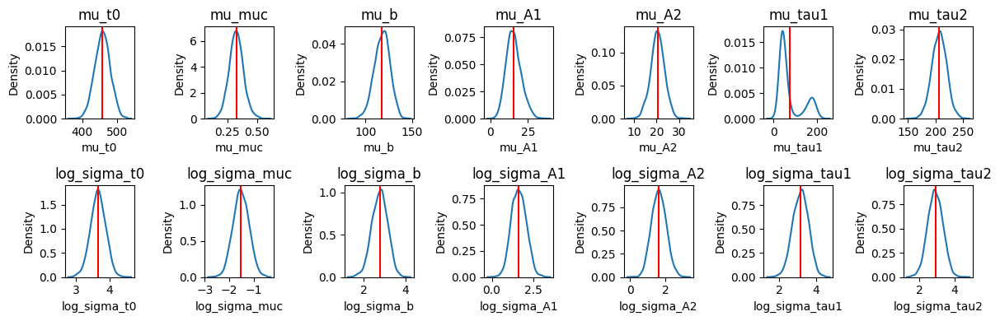

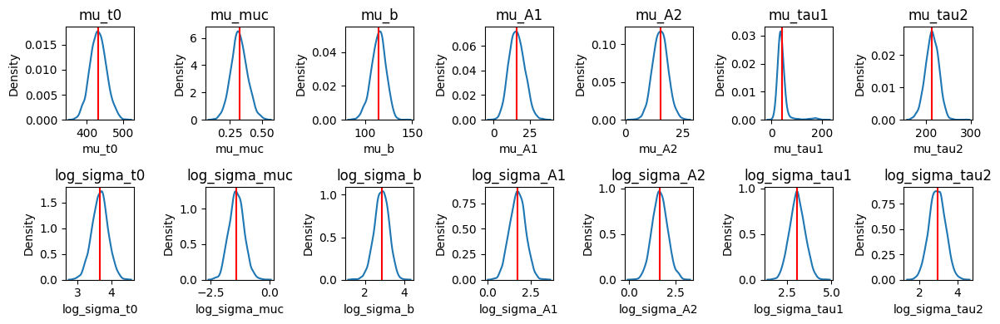

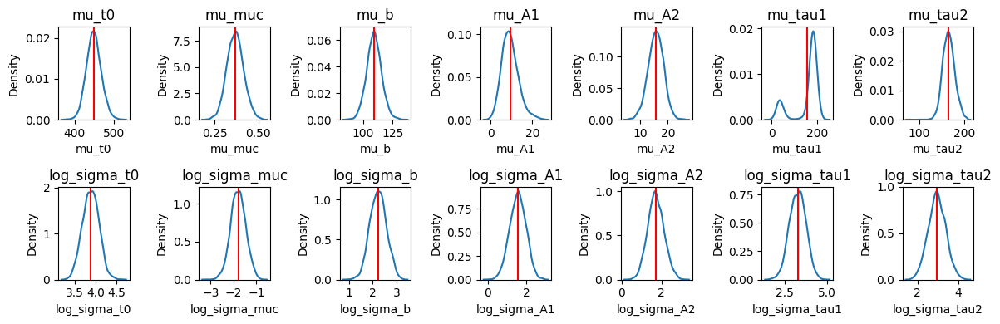

In [15]:
helpers.plot_group_samples(group_posterior_1a)
helpers.plot_group_samples(group_posterior_2)
helpers.plot_group_samples(group_posterior_3)

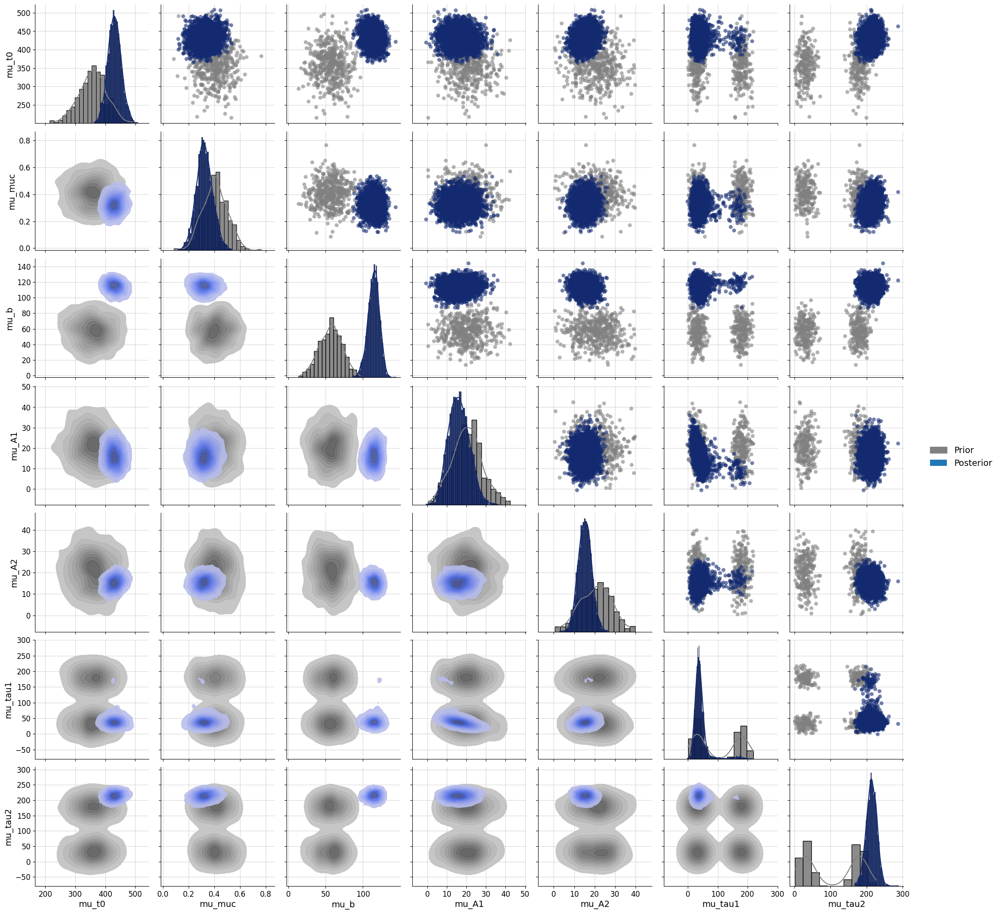

In [16]:
# pairs posterior plot
priors = dict(
    mu_t0=example_sim["mu_t0"], mu_b=example_sim["mu_b"], mu_muc=example_sim["mu_muc"], 
    mu_A1=example_sim["mu_A1"], mu_A2=example_sim["mu_A2"],
    mu_tau1=example_sim["mu_tau1"], mu_tau2=example_sim["mu_tau2"]#, 
#    log_sigma_t0=example_sim["log_sigma_t0"], log_sigma_muc=example_sim["log_sigma_muc"], 
#    log_sigma_A1=example_sim["log_sigma_A1"], log_sigma_A2=example_sim["log_sigma_A2"], 
#    log_sigma_tau1=example_sim["log_sigma_tau1"], log_sigma_tau2=example_sim["log_sigma_tau2"], 
#    log_sigma_b=example_sim["log_sigma_b"] 
)

mu_s = ["mu_t0", "mu_b", "mu_muc", "mu_A1", "mu_A2", "mu_tau1", "mu_tau2"]
#posterior_1a = {k: v[0] for k, v in group_posterior_1a.items() if k in mu_s}  # 1st participant
posterior_2 = {k: v[0] for k, v in group_posterior_2.items() if k in mu_s}  # 1st participant
#posterior_3 = {k: v[0] for k, v in group_posterior_3.items() if k in mu_s}  # 1st participant

#f=bf.diagnostics.pairs_posterior(estimates=posterior_1a, priors=priors)
f=bf.diagnostics.pairs_posterior(estimates=posterior_2, priors=priors)
#f=bf.diagnostics.pairs_posterior(estimates=posterior_3, priors=priors)

In [17]:
# pps group
def resim_group(group_posterior): 
    group_posterior_flat = {k: v.flatten() for k, v in group_posterior.items()}
    #print(group_posterior_flat)

    #TODO: sample from group posterior items / shuffle 
    n_resims = 1000
    resims_lst = []
    for i in range(n_resims): 
        iter_dict = {k: v[i] for k, v in group_posterior_flat.items() if v[i] > 0}
        if len(iter_dict.keys()) == 13: 
            resim = simulate_ddmc(
                #TODO: or sample parameters to use from N(mu_*, sigma_*)? 
                t0=iter_dict["mu_t0"],
                muc=iter_dict["mu_muc"], 
                b=iter_dict["mu_b"], 
                A1=iter_dict["mu_A1"], 
                A2=iter_dict["mu_A2"], 
                tau1=iter_dict["mu_tau1"], 
                tau2=iter_dict["mu_tau2"], 
                n_trials=4
            )
            resims_lst.append(resim["sim_data"])
    resims_full = np.stack(resims_lst)

    return resims_full.reshape(-1, resims_full.shape[-1])

resims_1a = resim_group(group_posterior_1a)
resims_2 = resim_group(group_posterior_2)
resims_3 = resim_group(group_posterior_3)

simulated ER:  0.037250000000000005
empirical ER:  0.0454282407407407
prior ER:  0.06799999999999995


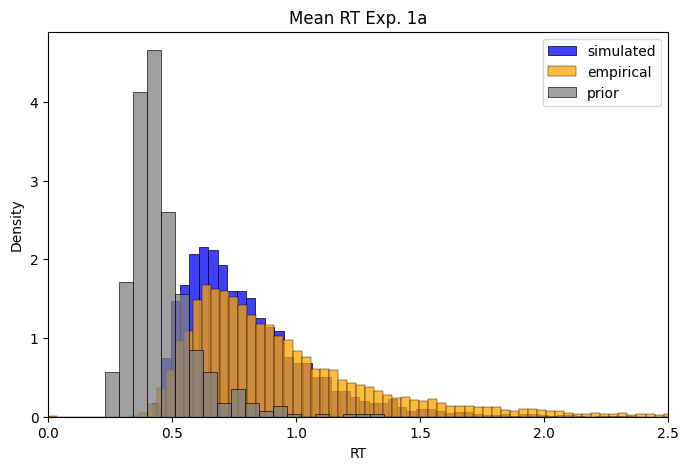

simulated ER:  0.0477977977977978
empirical ER:  0.06793478260869568
prior ER:  0.06799999999999995


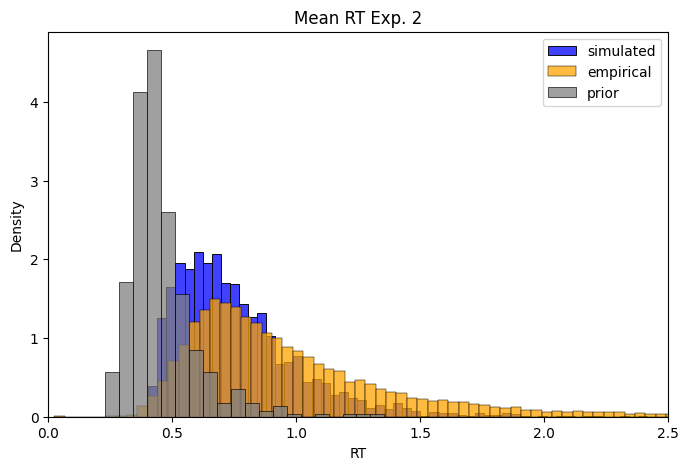

simulated ER:  0.035571142284569146
empirical ER:  0.05392795138888884
prior ER:  0.06799999999999995


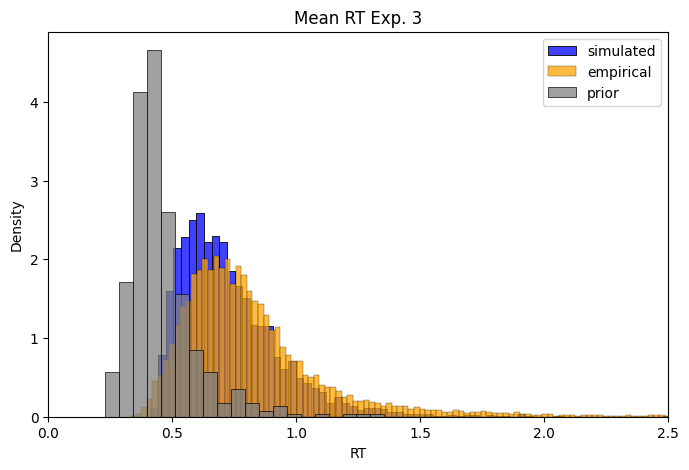

In [18]:
def plot_rts(resims_full, empirical, name):
    
    print("simulated ER: ", 1 - sum(resims_full[:,0]) / len(resims_full))
    print("empirical ER: ", 1 - sum(empirical["corr"]) / len(empirical))
    print("prior ER: ", 1 - sum(example_sim["sim_data"][:,0]) / example_sim["sim_data"].shape[0])

    plt.figure(figsize=(8, 5))
    
    sns.histplot(resims_full[:,1], stat="density", color="blue", label="simulated")
    sns.histplot(empirical["rt"], stat="density", color="orange", label="empirical")
    sns.histplot(example_sim['sim_data'][:,1], stat="density", color="gray", label="prior")

    plt.xlabel("RT")
    plt.xlim(0, 2.5)
    plt.legend()
    plt.title(f"Mean RT {name}")
    plt.show()

plot_rts(resims_1a, df_1a, "Exp. 1a")
plot_rts(resims_2, df_2, "Exp. 2")
plot_rts(resims_3, df_3, "Exp. 3")


Condition:  0 , M:  0.7678018768310546 , SD:  0.2798369246634834 , ER:  0.013
Condition:  1 , M:  0.8350988768310547 , SD:  0.26179789809521836 , ER:  0.043
Condition:  2 , M:  0.7860818768310546 , SD:  0.27869136492306246 , ER:  0.029
Condition:  3 , M:  0.8361138768310546 , SD:  0.26594060965879907 , ER:  0.064


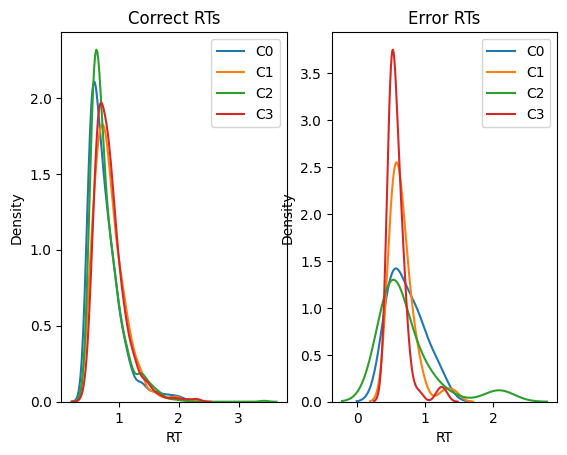

Condition:  0 , M:  0.741552308014802 , SD:  0.2745358947939222 , ER:  0.021021021021021023
Condition:  1 , M:  0.7786243800868742 , SD:  0.24279635321569037 , ER:  0.04804804804804805
Condition:  2 , M:  0.7420117674742612 , SD:  0.2521704933041102 , ER:  0.042042042042042045
Condition:  3 , M:  0.7858115672740612 , SD:  0.2519489242097766 , ER:  0.08008008008008008


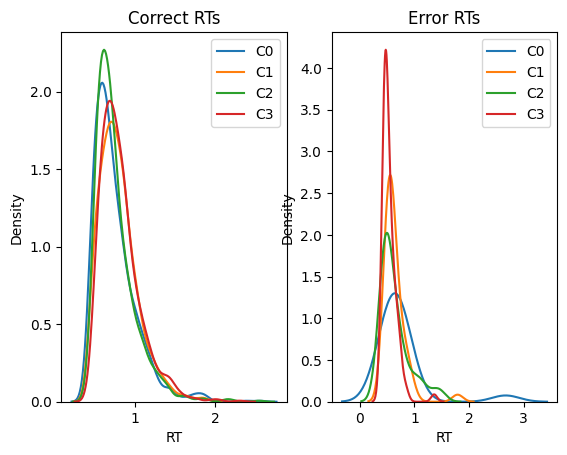

Condition:  0 , M:  0.6881890887793654 , SD:  0.20909561649812955 , ER:  0.017034068136272545
Condition:  1 , M:  0.7478003112242552 , SD:  0.21015896740185666 , ER:  0.04008016032064128
Condition:  2 , M:  0.7170728563144355 , SD:  0.20643655373935615 , ER:  0.026052104208416832
Condition:  3 , M:  0.7663854815649365 , SD:  0.19930881952492607 , ER:  0.05911823647294589


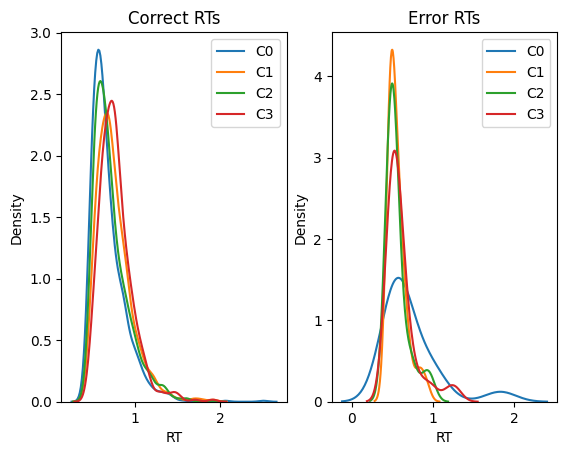

In [19]:
# per condition
plot_rts_conditions(resims_1a)
plot_rts_conditions(resims_2)
plot_rts_conditions(resims_3)

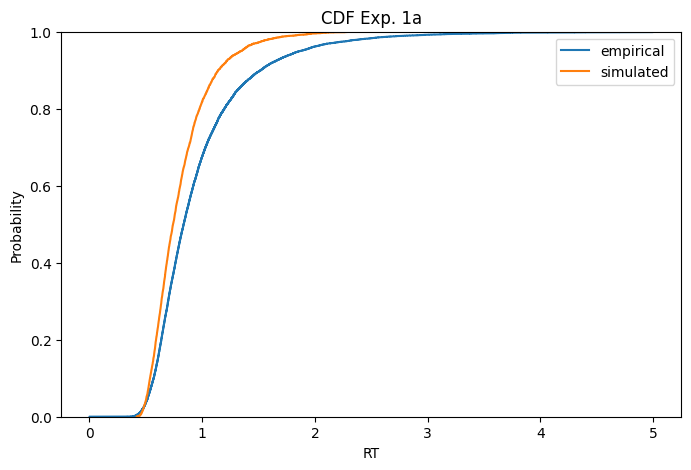

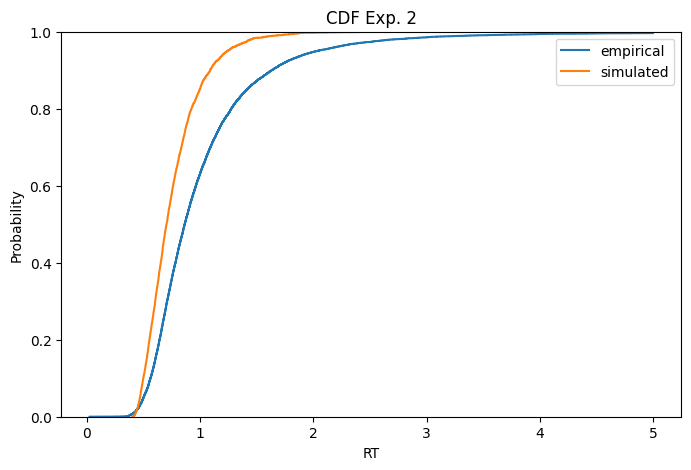

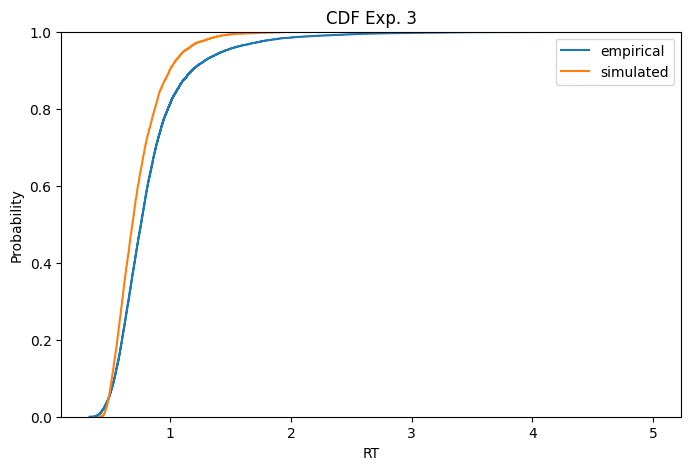

In [20]:
# CDF
helpers.plot_group_cdf(df_1a, resims_1a, "Exp. 1a")
helpers.plot_group_cdf(df_2, resims_2, "Exp. 2")
helpers.plot_group_cdf(df_3, resims_3, "Exp. 3")

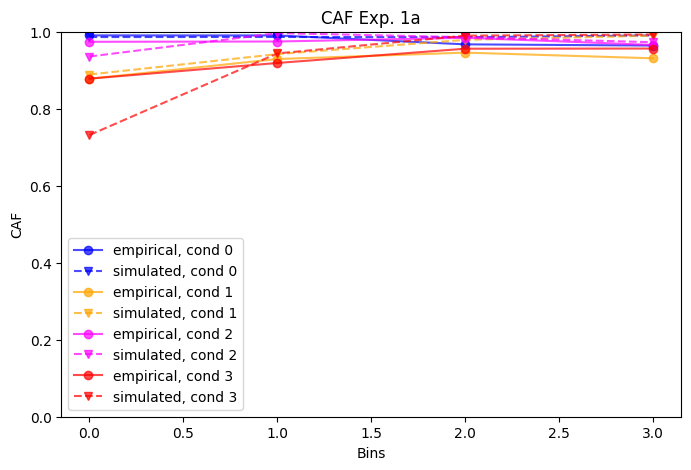

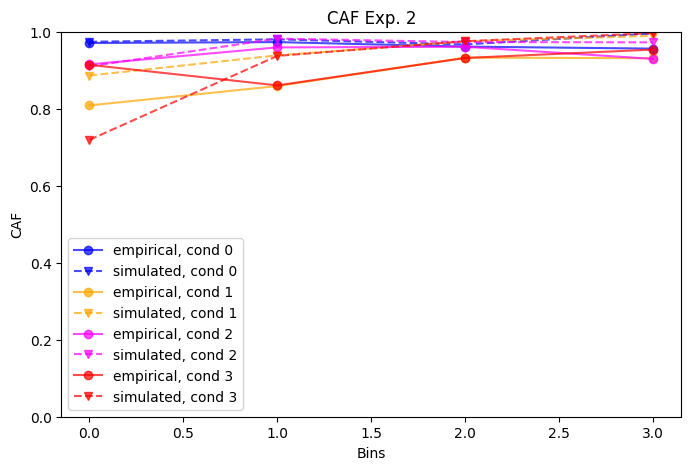

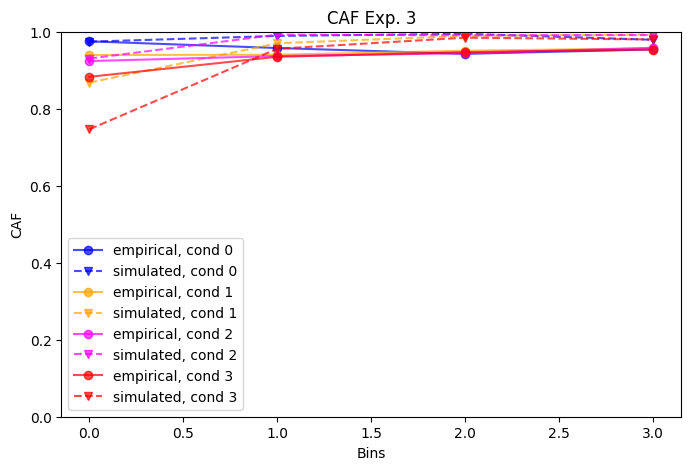

In [21]:
# CAF
helpers.plot_group_caf(df_1a, resims_1a, "Exp. 1a")
helpers.plot_group_caf(df_2, resims_2, "Exp. 2")
helpers.plot_group_caf(df_3, resims_3, "Exp. 3")

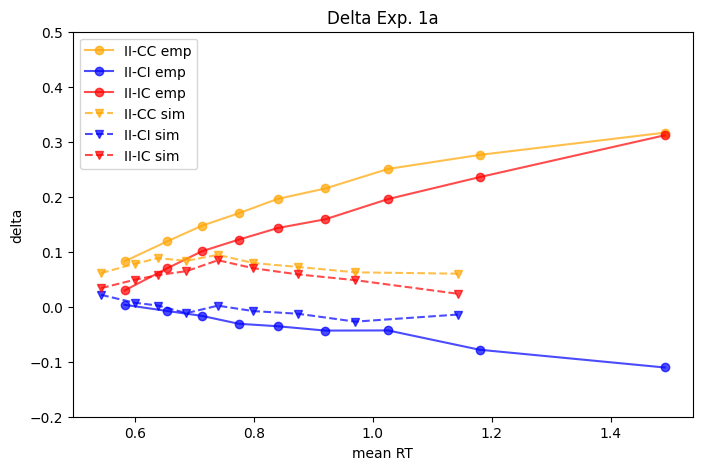

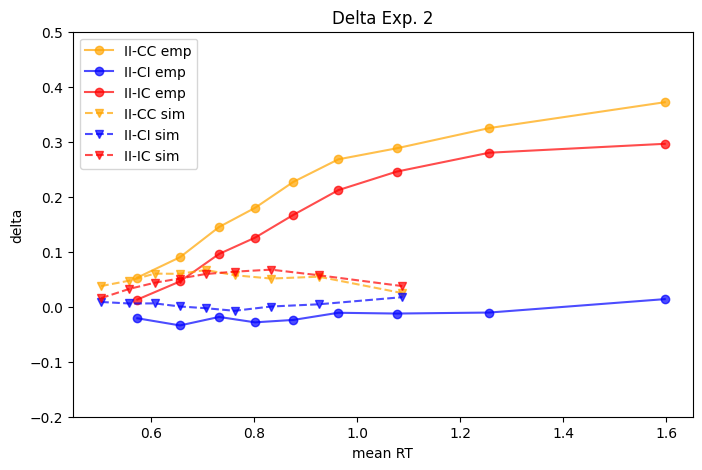

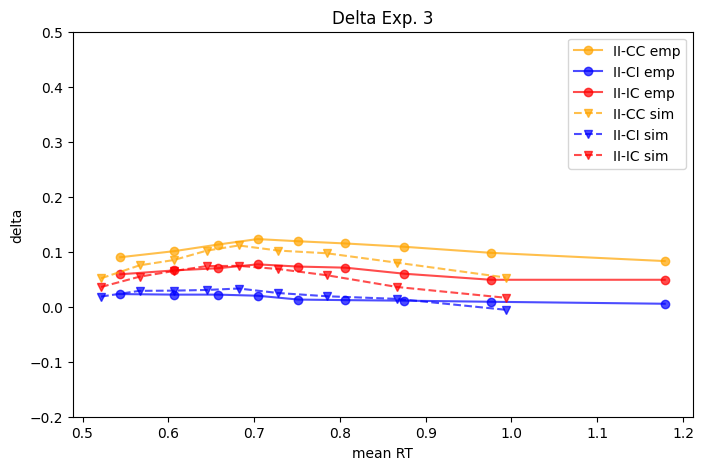

In [22]:
# delta
helpers.plot_group_delta(df_1a, resims_1a, "Exp. 1a")
helpers.plot_group_delta(df_2, resims_2, "Exp. 2")
helpers.plot_group_delta(df_3, resims_3, "Exp. 3")

## Subject level

In [23]:
def get_subject_posterior(data, n_subj, n_trls):
    subjects = []
    for sid, sdf in data.groupby("subject"): 
        arr = np.column_stack([sdf["corr"], sdf["rt"], sdf["conditions"]])

        subjects.append(arr)


    obs_data = np.stack(subjects)
    obs_data = obs_data[None, :, :]
    obs_data = {"sim_data": obs_data}

    if n_subj == 23:
        dummy_subject = obs_data["sim_data"][:, -1:, :, :]
        obs_data["sim_data"] = np.concatenate(
            [obs_data["sim_data"], dummy_subject], axis=1
        )
   
    obs_data["sim_data"] = obs_data["sim_data"].reshape(
        (1, n_subj // N_LOCAL_SUBJECTS, n_trls * 6, 3)
    )
    summaries = None

    n_resims = 50
    global_posterior = approximator_global.compositional_sample(
        num_samples=n_resims,
        conditions={'sim_data': obs_data['sim_data']}, # get rid of all unnecessary keys
        compute_prior_score=prior_global_score,
        compositional_bridge_d1=0.1,     # hyperparameter, control error accumulation
        compositional_bridge_d0=0.1,     # hyperparameter, control error accumulation
        method='two_step_adaptive',       # hyperparameter, try "euler_maruyama" for non-adaptive method
        steps='adaptive',                 # hyperparameter, speed vs accuracy/stability
        mini_batch_size=10,               # hyperparameter, memory/speed vs accuracy
        batch_size=BATCH_SIZE*10,
        return_summaries=True,
        summaries=summaries,
    )
    summaries = global_posterior.pop("_summaries")

    obs_data["sim_data"] = obs_data["sim_data"].reshape((1, 24, n_trls, 3))

    local_posterior = approximator_local.ancestral_sample(
        conditions={'sim_data': obs_data['sim_data']},
        ancestral_conditions=global_posterior,
        batch_size=BATCH_SIZE*N_SAMPLES,
    )

    return local_posterior


subject_posterior_1a = get_subject_posterior(df_1a, 24, 3*192)     # 24 subjects * 3 blocks * 192 trials
subject_posterior_2 = get_subject_posterior(df_2, 23, 3*192)      # 23 subjects * 3 blocks * 192 trials
subject_posterior_3 = get_subject_posterior(df_3, 24, 4*192)      # 24 subjects * 4 blocks * 192 trials

Summarizing:   0%|          | 0/1 [00:00<?, ?batch/s]

Sampling:   0%|          | 0/1 [00:00<?, ?batch/s]

Summarizing:   0%|          | 0/1 [00:00<?, ?batch/s]

Sampling:   0%|          | 0/1 [00:00<?, ?batch/s]

Summarizing:   0%|          | 0/1 [00:00<?, ?batch/s]

Sampling:   0%|          | 0/1 [00:00<?, ?batch/s]

Summarizing:   0%|          | 0/1 [00:00<?, ?batch/s]

Sampling:   0%|          | 0/1 [00:00<?, ?batch/s]

Summarizing:   0%|          | 0/1 [00:00<?, ?batch/s]

Sampling:   0%|          | 0/1 [00:00<?, ?batch/s]

Summarizing:   0%|          | 0/1 [00:00<?, ?batch/s]

Sampling:   0%|          | 0/1 [00:00<?, ?batch/s]

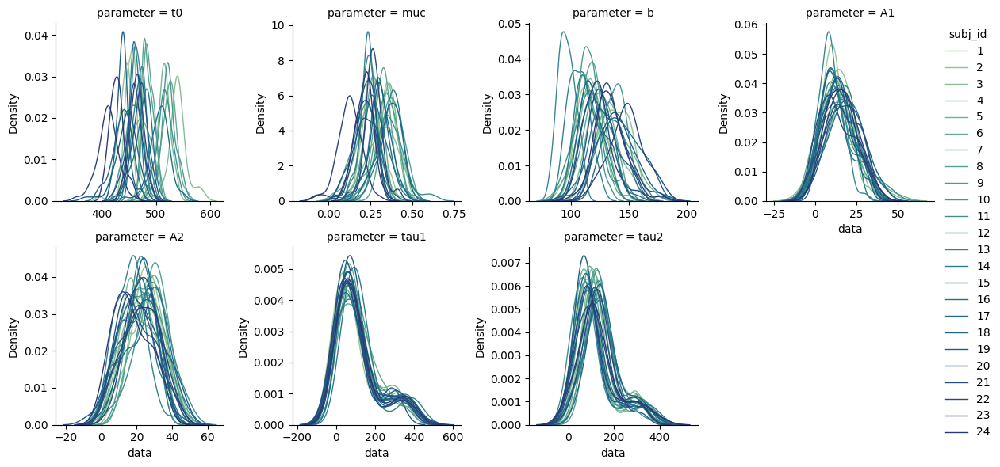

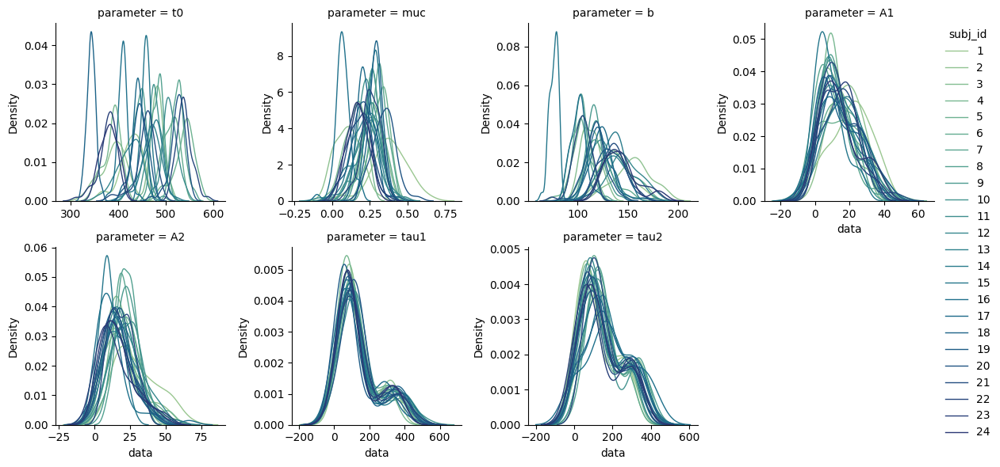

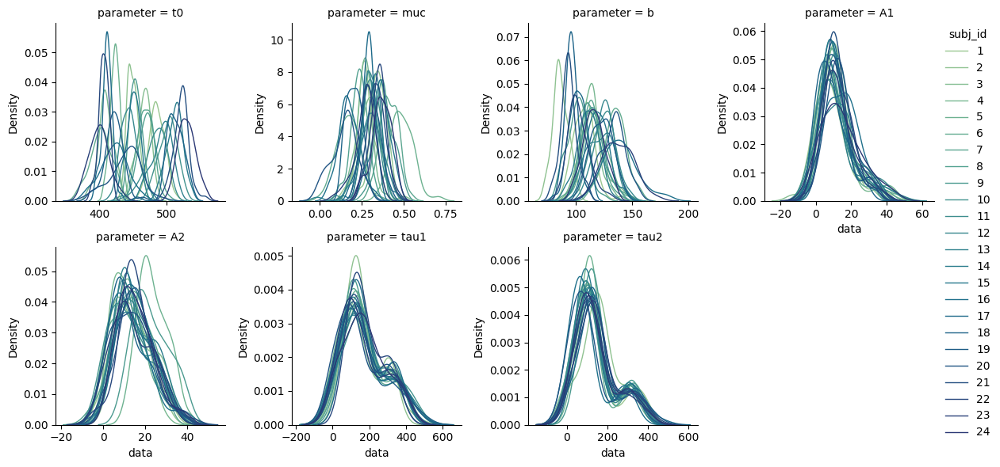

In [24]:
def plot_subj_posteriors(local_posterior): 
    data_lst = []
    for param in local_posterior.keys(): 
        data = local_posterior[param][0]
        for idx, i in enumerate(data): 
            d = {"subj_id" : idx+1, "data" : i.flatten(), "parameter": param}
            df = pd.DataFrame(d)
            data_lst.append(df)
    df_local_posterior = pd.concat(data_lst)

    f = sns.FacetGrid(
        df_local_posterior, col="parameter", col_wrap=4, 
        sharex=False, sharey=False, hue="subj_id", palette = "crest"
    )
    f.map_dataframe(sns.kdeplot, x="data",  linewidth=1)

    f.add_legend()

plot_subj_posteriors(subject_posterior_1a)
plot_subj_posteriors(subject_posterior_2)
plot_subj_posteriors(subject_posterior_3)

In [25]:
def resim_subjects(local_posterior):
    resims_lst = []
    n_resims = 50

    for subj in range(24):
        subj_dict = {
            param: local_posterior[param][0, subj, :, 0]
            for param in local_posterior
        }

        for i in range(n_resims): 
            iter_dict = {k: v[i] for k, v in subj_dict.items()}
            resim = simulate_ddmc(**iter_dict, n_trials=4)["sim_data"]
            df_resim = pd.DataFrame(resim, columns=["resp", "rt", "cond"])
            df_resim["subject"] = subj
            df_resim["resim"] = i

            # store the sampled parameters
            for k, v in iter_dict.items():
                df_resim[k] = v

            resims_lst.append(df_resim)

    return pd.concat(resims_lst, ignore_index=True) 

resim_local_1a = resim_subjects(subject_posterior_1a)
resim_local_2 = resim_subjects(subject_posterior_2)
resim_local_3 = resim_subjects(subject_posterior_3)

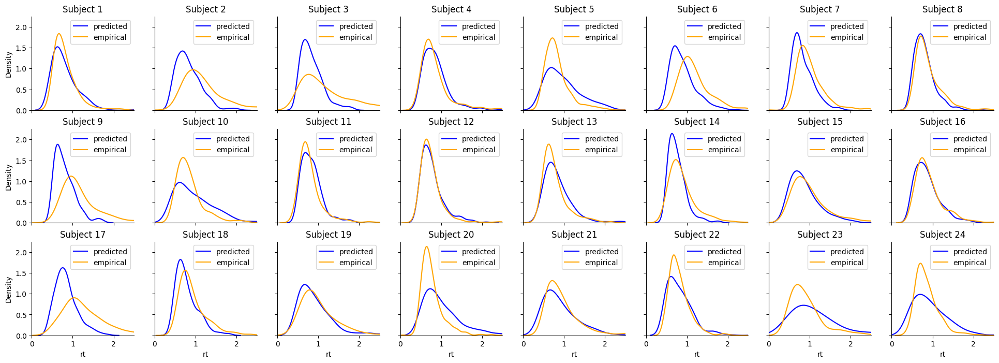

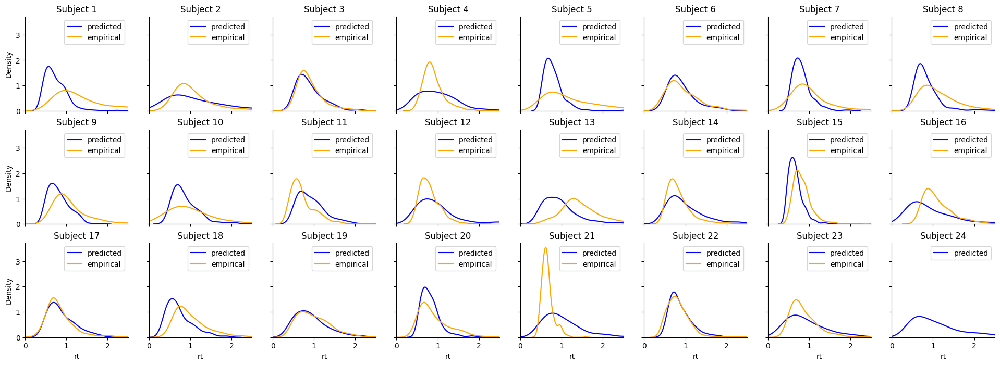

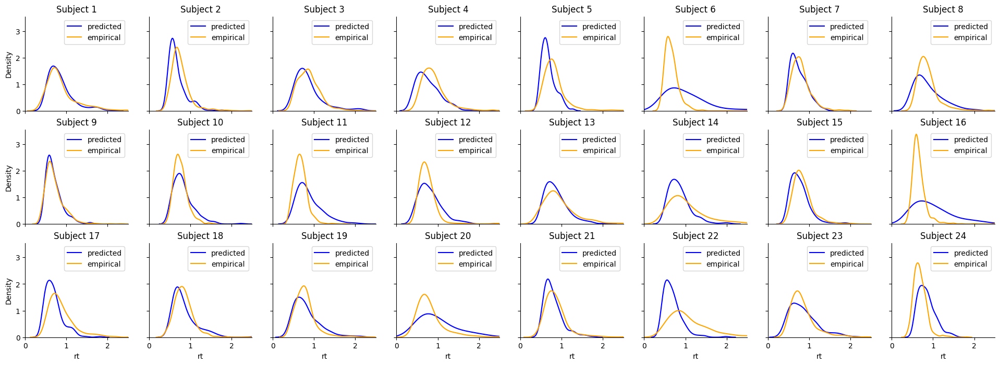

In [26]:
# Densities
helpers.plot_subjects_kde(resim_local_1a, df_1a)
helpers.plot_subjects_kde(resim_local_2, df_2)
helpers.plot_subjects_kde(resim_local_3, df_3)

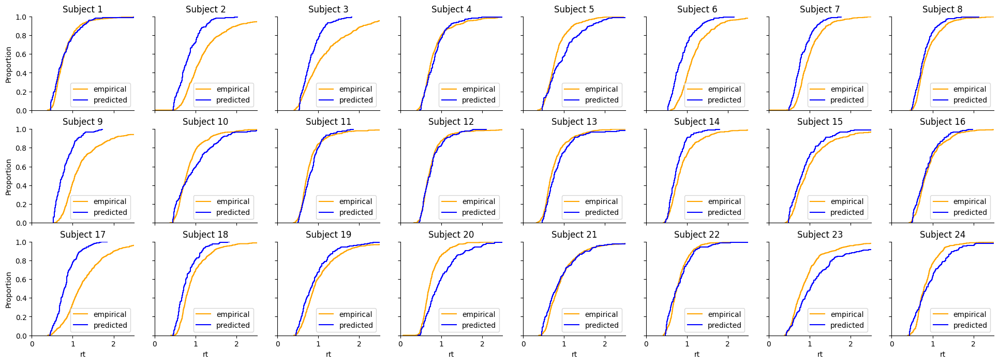

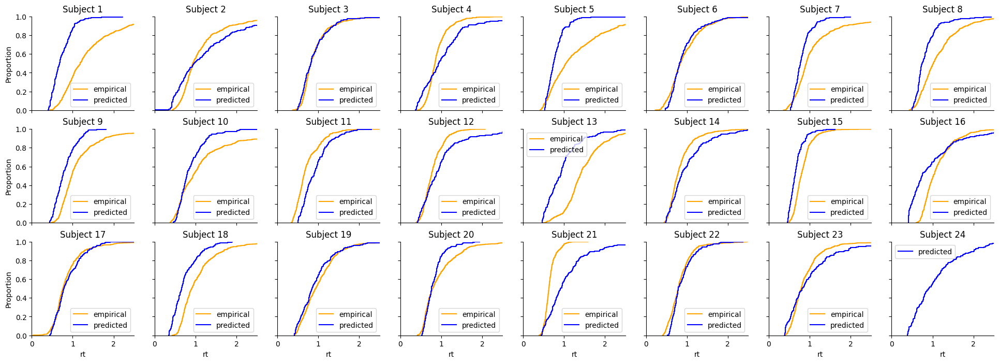

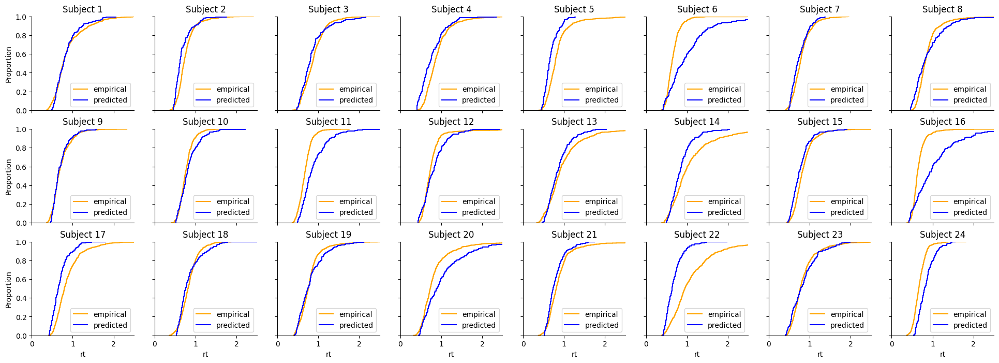

In [27]:
# CDF
helpers.plot_subjects_cdf(df_1a, resim_local_1a)
helpers.plot_subjects_cdf(df_2, resim_local_2)
helpers.plot_subjects_cdf(df_3, resim_local_3)

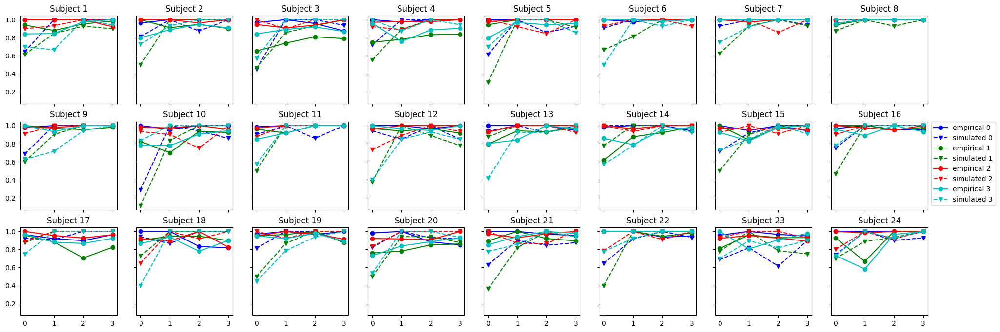

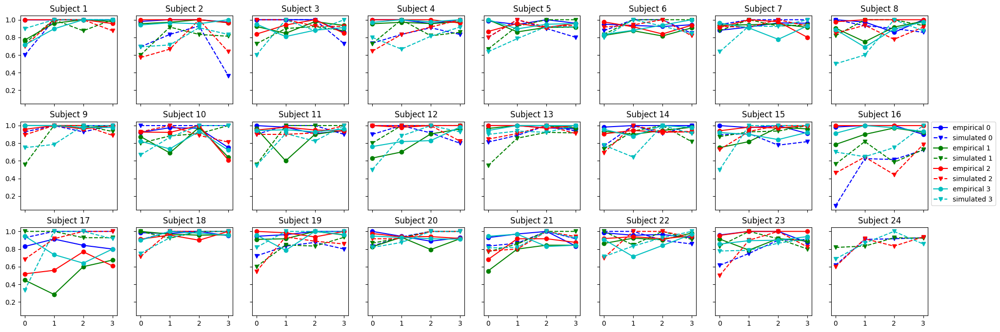

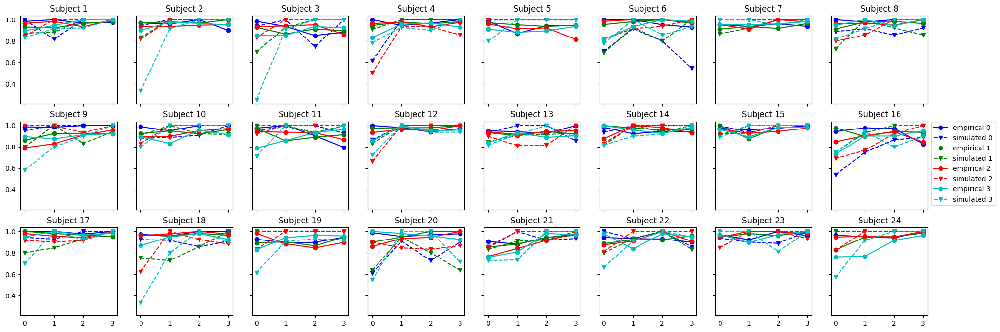

In [28]:
# CAF
helpers.plot_subjects_caf(df_1a, resim_local_1a)
helpers.plot_subjects_caf(df_2, resim_local_2)
helpers.plot_subjects_caf(df_3, resim_local_3)

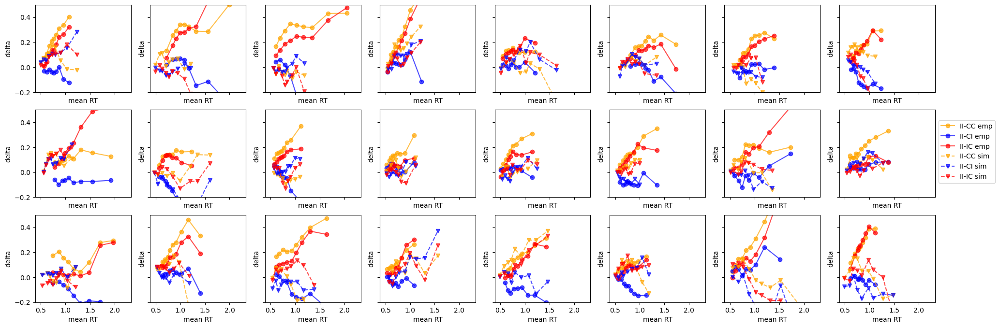

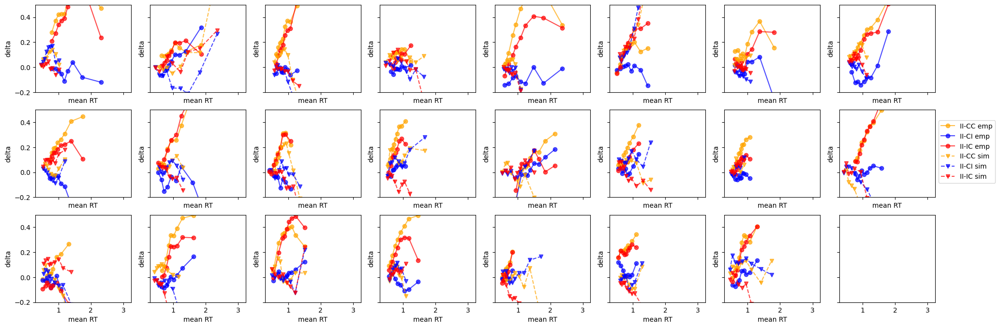

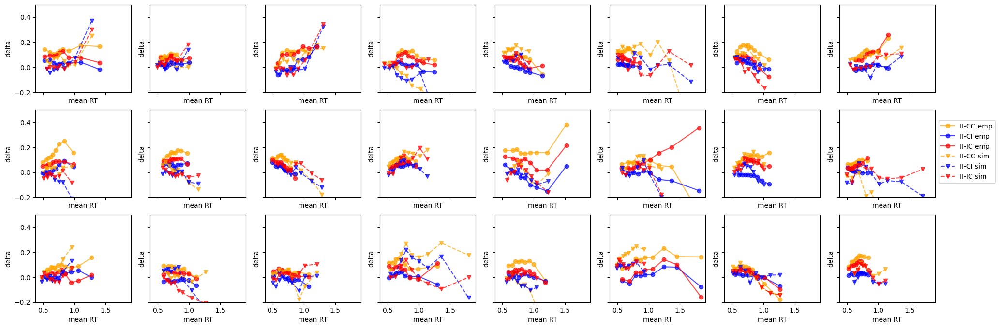

In [29]:
# delta   
helpers.plot_subjects_delta(df_1a, resim_local_1a)
helpers.plot_subjects_delta(df_2, resim_local_2)
helpers.plot_subjects_delta(df_3, resim_local_3)

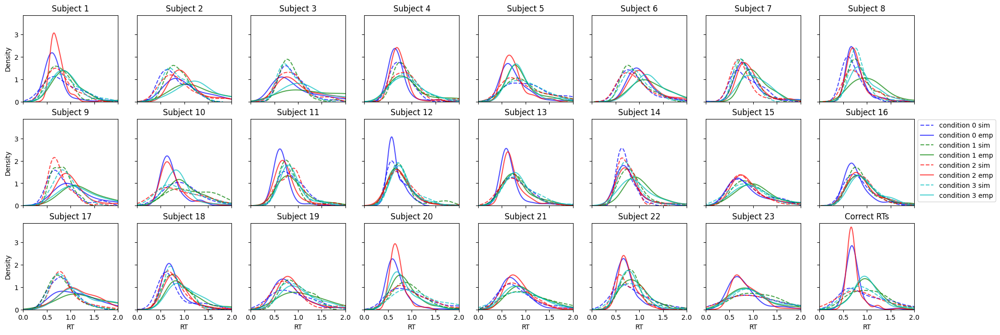

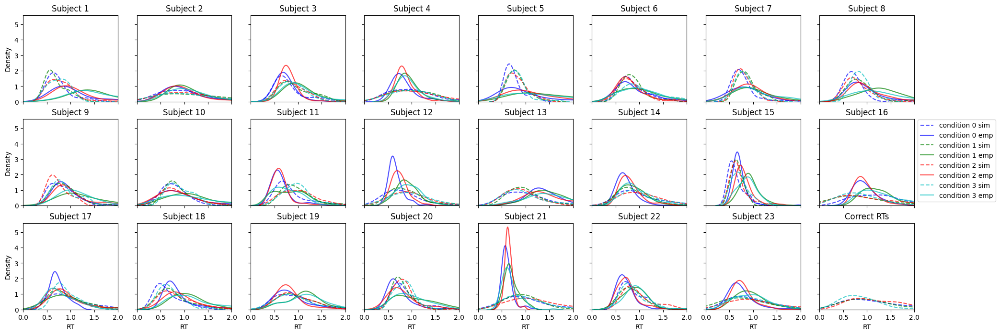

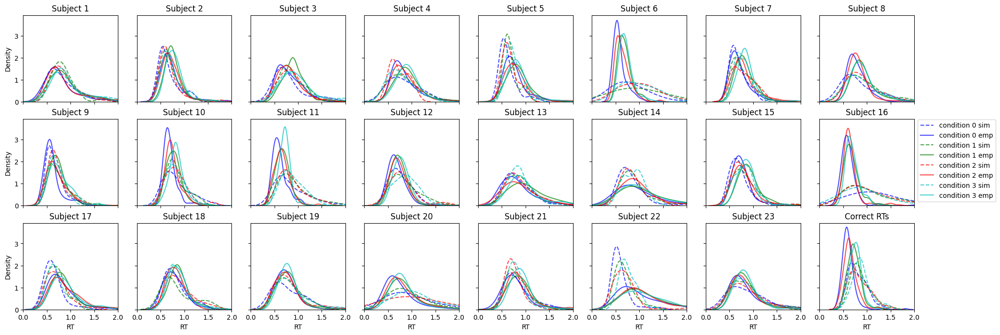

In [ ]:
# Densities
helpers.plot_subjects_kdes_cond(df_1a, resim_local_1a)
helpers.plot_subjects_kdes_cond(df_2, resim_local_2)
helpers.plot_subjects_kdes_cond(df_3, resim_local_3)